<div style="font-size:30pt; line-height:25pt; font-weight:bold; text-align:center;">Neural Style Transfer (NST)</div>

<div class="alert alert-warning">

Ce notebook traite du sujet du Neural Style Transfert. Il est accompagné de fonctions utiles pour le déroulement du notebook (dans le fichier **useful_functions.py**) mais inutiles dans le détail pour la compréhension du sujet ; et du modèle Vgg19 pré-entrainé et adapté (dans le fichier **models/definitions/vgg19.py**), auquel nous ferons référence dans ce notebook. Nous vous encourageons à ouvrir ce fichier pour jeter un oeil au code commenté de ce modèle, bien que ce dernier sera très largement expliqué et illustré dans ce notebook. 

<div class='alert alert-primary'>

## Installation 

Si vous n'avez pas lu le fichier README.md, suivez les commandes suivantes :

Pour configurer l'environnement, utilisez la commande suivante :

```sh
conda env create -f environment.yml
```
Ensuite, activez l'environnement
```sh
conda activate NST_env
```
Une fois l'environnement configuré, ouvrez le Jupyter Notebook souhaité :

    Pour la version en anglais : NST_eng.ipynb
    Pour la version en français : NST_fr.ipynb

Suivez les instructions du notebook pour appliquer le Neural Style Transfer et explorer les résultats.

Amusez-vous bien !

<div style="text-align: center;">
    <img src="illustrations/gif.gif" alt="Animation d'illustration" />
</div>


### Import

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import torch
from torchvision import transforms
from torch.autograd import Variable
from torch.optim import LBFGS
import os
from models.definitions.vgg19 import Vgg19
from models.definitions.vgg19_average_pooling import VGG_avg_pool

import useful_functions
from useful_functions import display_images_side_by_side, save_and_maybe_display, generate_difference_heatmap, show_heatmap, display_generated_image, create_gif_from_images, display_gif, display_five_images, select_files

### Définitions des répertoires où sont stockées les images

In [2]:
PATH = './'
default_resource_dir = os.path.join(PATH, 'data')
content_images_dir = os.path.join(default_resource_dir, 'content-images')
style_images_dir = os.path.join(default_resource_dir, 'style-images')
output_img_dir = os.path.join(default_resource_dir, 'output-images')
img_format = (4, '.jpg')

# Introduction théorique globale

<div class="alert alert-warning">

Les paragraphes suivants ont pour vocation de vous donner un premier aperçu de l'objectif du **Neural Style Transfer**, et de son fonctionnement. Les différentes parties du notebook entreront davantage dans le détail de la théorie et du fonctionnement de chaque étape, accompagnant le code commenté.  

Le Neural Style Transfer (NST) est une **technique de deep learning** qui permet de fusionner le contenu d’une image (la *content image* dans notre cas) avec le style d’une autre (la *style image*). Il repose sur l’utilisation de réseaux de neurones convolutifs (CNN), comme le modèle VGG-19 que nous utiliserons, pour extraire et recombiner les caractéristiques des images de contenu et de style. L’objectif est de **générer une nouvelle image qui conserve la structure de l’image de contenu tout en adoptant les textures et les motifs de l’image de style**.  
  
<center><img src="illustrations/example1.png"></center>

Le NST repose sur plusieurs étapes clés. Tout d’abord, les images sont prétraitées (1) : elles sont chargées, redimensionnées et normalisées pour correspondre aux attentes du modèle. Ensuite, un modèle pré-entraîné (2), en l’occurrence **VGG-19**, est utilisé pour extraire différentes représentations des images. Ce modèle n’est pas entraîné mais simplement utilisé comme un extracteur de caractéristiques.

Le NST doit être en mesure de représenter à la fois le contenu de la *content image* et le style de la *style image*. Une **couche spécifique du réseau est choisie pour capturer la structure et les formes principales de l’image de contenu**. En parallèle, le style de l’image est extrait à l’aide de la matrice de Gram (3), qui capture les corrélations entre les différentes activations des filtres du réseau. Cette matrice permet de représenter les textures et motifs caractéristiques du style de l’image.

Une fois ces représentations obtenues, une fonction de perte (loss) est définie pour guider l’optimisation. Cette fonction comprend trois composantes principales (4) : la **perte de contenu**, qui mesure la différence entre l’image générée et l’image de contenu, la **perte de style**, qui évalue la similarité entre les matrices de Gram de l’image générée et celles de l’image de style, et enfin **la perte de variation totale**, qui encourage la continuité des pixels afin d’éviter les artefacts et le bruit.

L’image générée est initialisée à partir de l’image de contenu, puis optimisée par un algorithme tel que **L-BFGS**, qui ajuste progressivement ses pixels pour minimiser la fonction de perte. Cette optimisation est réalisée sur plusieurs itérations, au cours desquelles l’image évolue progressivement pour intégrer le style de l’image de référence tout en conservant la structure de l’image originale (5).

<div class="alert alert-success">

Dans ce notebook, nous allons suivre ces différentes étapes :
**

1. **Prétraitement des images (chargement, normalisation, conversion au format attendu).**
2. **Construction du modèle VGG-19 pour extraire les caractéristiques du contenu et du style.**
3. **Extraction des représentations du style à partir du réseau.**
4. **Définition des pertes (contenu, style, variation).**
5. **Implémentation finale et résultats**
6. **Discussions et comparaisons**

Laissez-vous guider par ce notebook, et vous deviendrez un expert du Neural Style Transfer !

</div>

<div class="alert alert-warning">

**TIPS** : la génération de l'image finale peut prendre une dizaine de minutes (selon votre machine). Nous vous conseillons de la lancer dès maintenant, afin que la génération se fasse pendant que vous parcourez le notebook. Pour cela, nous vous invitons à suivre les consignes suivantes :


Renseignez dans la brique de code ci-dessous les noms des images "content" et "style" sur lesquelles vous voulez procéder au NST. Assurez-vous que les images soient stockées respectivement :  
🔹 dans le répertoire **"content-images"** pour l'image de contenu  
🔹 dans le répertoire **"style-images"** pour l'image de style  


Vous pouvez choisir la combinaison de votre choix dans les images déjà disponibles dans les 2 répertoires, ou bien importer des images de votre choix (ce dernier point est particulièrement conseillé pour vous investir au maximum dans ce notebook!). Des exemples avec les images issues des dossiers vous seront fournis en fin de notebook. 


Lancer le notebook (au moins jusqu'à la fin de la partie *"**5. Implémentation finale et Résultats**"*, **faites un "Run all" pour plus de simplicité** si vous préférez).
Vérifiez que le calcul se lance et que des lignes semblables aux suivantes s'affichent après la ligne de code *results_path = neural_style_transfer(optimization_config)* en section 5 :   


![alt text](illustrations/terminal.png)  



In [3]:
CONTENT_IMAGE = 'berlin.jpg'  # EDIT ME NOW !!
STYLE_IMAGE = 'van_gogh.jpg'   # EDIT ME NOW !!
MODEL = Vgg19(requires_grad=False, show_progress=True)   # EDIT LATER with VGG_avg_pool(requires_grad=False, show_progress=True)
NUM_ITERATIONS = 500   #EDIT ME LATER

/home/lcharles/miniconda3/envs/nst/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/lcharles/miniconda3/envs/nst/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Vous pouvez maintenant dérouler le notebook en laissant votre calcul tourner en fond !

# 1. Le pré-traitement des images 

Cette partie est une partie préliminaire qui s'articule autour d'un pré-traitement des images. Pour rappel, le modèle sur lequel nous nous baserons pour la suite des traitements dans le cadre du NST constitue un **réseau de neurones type VGG**. Or, ces réseaux ont entraînés sur de grands ensembles de données comme ImageNet, où les **pixels des images sont normalisés pour avoir des moyennes et des écarts types spécifiques**.
Par exemple, les couleurs des images sont centrées autour des moyennes *IMAGENET_MEAN_255* et standardisées. C'est pourquoi nous définissons les 2 variables globales suivantes, utiles pour notre pré-traitement. 

In [4]:
IMAGENET_MEAN_255 = [123.675, 116.28, 103.53]  # moyennes des canaux RGB de l'image 
IMAGENET_STD_NEUTRAL = [1, 1, 1]  # valeurs d'écart-type neutres

<div class="alert alert-info">

Nous appliquons ainsi la même normalisation aux images que celle issue des données d'entrainement de VGG, pour deux raisons principales :  
🔹 **Garder une cohérence avec l'entraînement du réseau** : cela garantit que le réseau interprète correctement les caractéristiques des images.  
🔹 Conserver une stabilité des activations : cela évite des écarts dans les activations des couches internes, ce qui est crucial pour des calculs précis de contenu et de style.

In [5]:
def load_image(img_path,target_shape="None"):
    '''
    Charge une image depuis un chemin donné.
    Redimensionne l'image selon la taille cible.
    Retourne l'image prête pour des traitements ultérieurs.
    '''
    if not os.path.exists(img_path):
        raise Exception(f'Path not found: {img_path}')
    img = cv.imread(img_path)[:, :, ::-1]                   # convertit BGR en RGB 
    if target_shape is not None:
        if isinstance(target_shape, int) and target_shape != -1:
            current_height, current_width = img.shape[:2]
            new_height = target_shape
            new_width = int(current_width * (new_height / current_height))
            img = cv.resize(img, (new_width, new_height), interpolation=cv.INTER_CUBIC)
        else:
            img = cv.resize(img, (target_shape[1], target_shape[0]), interpolation=cv.INTER_CUBIC)
    img = img.astype(np.float32)
    img /= 255.0
    return img

def prepare_img(img_path, target_shape, device):
    '''
    Transforme l'image en un tenseur PyTorch
    '''
    img = load_image(img_path, target_shape=target_shape)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255)),
        transforms.Normalize(mean=IMAGENET_MEAN_255, std=IMAGENET_STD_NEUTRAL)])
    img = transform(img).to(device).unsqueeze(0)
    return img

def save_image(img, img_path):
    ''' 
    Sauvegarde l'image à l'emplacement indiqué
    '''
    if len(img.shape) == 2:
        img = np.stack((img,) * 3, axis=-1)
        
    cv.imwrite(img_path, img[:, :, ::-1]) 

Appliquons ce pré-traitement à votre image :

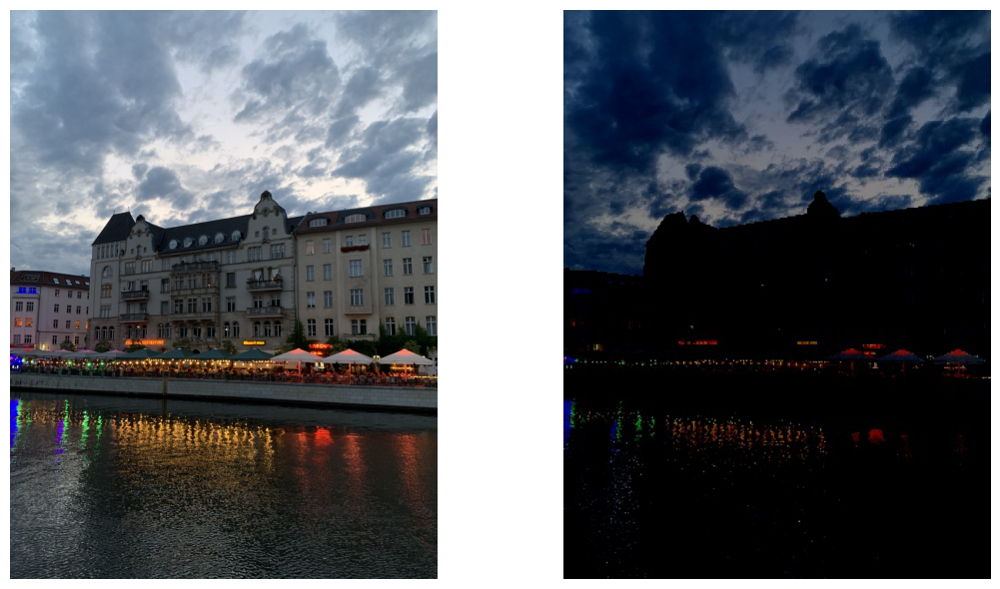

In [6]:
path_img = os.path.join(".", "data", "content-images", CONTENT_IMAGE)
path_save = os.path.join(".", "data", "treated-images", CONTENT_IMAGE)
img = prepare_img(path_img, 400, 'cpu')
img_numpy = img.squeeze(0).permute(1, 2, 0).cpu().numpy()
save_image(img_numpy, path_save)
display_images_side_by_side(path_img, path_save)

🔹 L'image a bien été redimentionnée, tout en conservant ses proportions.  
🔹 Les couleurs de l'image ont été modifiées considérablement. Ceci est dû aux étapes de normalisation évoquées précédemment. 

<div class="alert alert-info">

**Mais n'est-ce pas problématique que notre photo de départ soit autant modifiée dans ses couleurs ?**

Et non ! Dans le NST, nous n'utilisons pas directement les couleurs ou les pixels bruts. À la place, nous travaillons avec des activations des couches convolutives du réseau :

🔹 Ces activations extraient des cartes de caractéristiques (features) abstraites, qui capturent des motifs ou textures.  
🔹 Elles sont ainsi moins sensibles aux variations de couleurs individuelles.

Ainsi, même si la normalisation modifie les couleurs, cela n'impacte pas le NST, car :

🔹 Les calculs reposent sur des représentations abstraites, comme les corrélations des filtres (via la matrice de Gram pour le style) ou les activations des couches profondes (pour le contenu).

Pas de panique ! La fonction *save_and_maybe_display* (dans useful_functions.py) dénormalise l'image avant de la sauvegarder et de l'afficher. Ce procédé de normalisation est ainsi masqué pour l'utilisateur !

Regardons sur un nouvel exemple (celui de l'animation d'introduction)

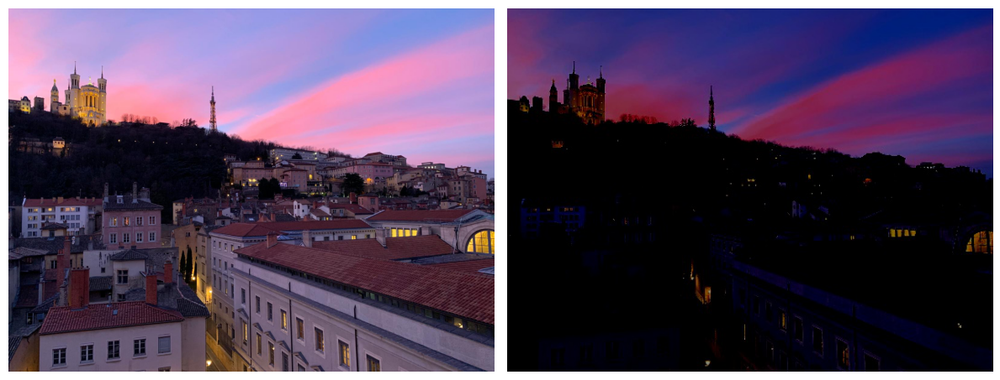

In [7]:
# img = prepare_img("data/content-images/lyon.jpg", 400, 'cpu')
# img_numpy = img.squeeze(0).permute(1, 2, 0).cpu().numpy()
# save_image(img_numpy, './img_lyon.jpg')
display_images_side_by_side("./data/content-images/lyon.jpg", './illustrations/lyon_treated.jpg')

# 2. Préparation du modèle 

Dans un premier temps, nous allons implémenter la fonction de chargement et de prépartion du modèle VGG19, modèle sur lequel nous nous basons pour notre NST. 
Avant toute chose, jetons un oeil à ce modèle, que nous chargeons déjà pré-entrainé depuis Pytorch. 

In [8]:
from torchvision import models

model_init = models.vgg19(pretrained=True)
print(model_init)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

<center>
        <img src="illustrations/archivgg19.png" alt="VGG19" width="700">
        <figcaption>Schéma des différentes couches du modèle VGG19.</figcaption>
</center>
    


<div class="alert alert-info">

**VGG19**

**VGG19** est un réseau neuronal convolutif (CNN) entraîné sur des millions d'images de catégories différentes, notamment issues de la base de données ImageNet (mentionnée précédemment). C'est une amélioration d'un autre CNN, VGG16, bénéficiant de davantage de couches convolutives que son prédécesseur, 19. Les couches sont détaillées sur le schéma ci-dessus.   
Les modèles VGG sont initialement entrainés pour de la classification d'images. Cependant, il est tout à fait possible de l'utiliser à d'autres fins. On peut par exemple **récupérer les caractéristiques d'une image dans des couches spécifiques** comme les couches convolutives, **afin d'identifier le contenu ou le style d'une image**. 

Pour le NST, nous allons implémenter un modèle légèrement modifié du modèle Vgg19 pré-entrainé. Nous expliquons ci-dessous les changements et leurs justifications. Pour une vue plus précise, nous vous inviter à explorer le code de la class *Vgg19* dans l'onglet **models**.  Cette classe est conçue spécifiquement pour les besoins du NST en permet l'extraction de représentations intermédiaires des couches pour le contenu et le style. Ce modèle présente les caractéristiques suivantes :  

🔹Sont **seulement extraites les couches convolutives et les couches de pooling** du modèle VGG19, couches nécessaires au traitement des caractéristiques de bas niveau (utilisées dans le NST).  

🔹Par défaut, nous avons fait le choix suivant : la couche **conv4_2** est utilisée pour représenter le contenu dans le contexte du NST. Pourquoi ? C'est une couche relativement profonde dans le réseau VGG19. Elle capte des informations de haut niveau, comme les formes et structures globales d'une image, plutôt que des détails de bas niveau comme les textures ou les motifs locaux. Mais contrairement à des couches très profondes (comme celles après conv5), conv4_2 conserve suffisamment de localisation spatiale pour préserver la structure géométrique de l'image. A noter que l'utilisation d'une unique couche pour le contenu se justifie par sa structure unifiée et une simplicité d'optimisation (plusieurs couches n'apportent pas réellement d'amélioration). Dans la partie "**6. Discussion et Comparaisons**" du notebook, nous comparerons les résultats obtenus en choisissant une autre couche *content*, différente de **conv4_2**.
  
🔹Les **autres couches** sont utilisées pour capturer les caractéristiques de style (*cf schéma*). En utilisant plusieurs couches, le style est décrit par un ensemble diversifié de caractéristiques allant des motifs simples (textures) aux relations complexes (corrélations de motifs). Les couches peu profondes (comme ***layer1_1***) capturent des informations de bas niveau, comme les textures fines ou les motifs locaux ; tandis que les couches profondes (comme ***layer5_1***) capturent des informations de style plus globales et abstraites.   

Préparons un tel modèle, et regardons ses caractéristiques !

In [9]:
def prepare_model(device):
    '''
    Charge le modèle VGG pré-entrainé
    Identifie les indices des couches du modèle utilisées pour extraire les caractéristiques de contenu et de style.
    Retourne le modèle prêt à être utilisé
    '''
    model = MODEL   #On ne calcule pas les gradients car on ne veut pas entrainer le modèle ici
    content_feature_maps_index = model.content_feature_maps_index   #Indice de la couche spécifique du réseau utilisée pour extraire les caractéristiques du contenu de l'image.
    style_feature_maps_indices = model.style_feature_maps_indices   #Indices des couches utilisées pour extraire les caractéristiques du style
    layer_names = model.layer_names
    content_fms_index_name = (content_feature_maps_index, layer_names[content_feature_maps_index])
    style_fms_indices_names = (style_feature_maps_indices, layer_names)
    return model.to(device).eval(), content_fms_index_name, style_fms_indices_names

In [10]:
model = Vgg19(requires_grad=False, show_progress=True)   #On ne calcule pas les gradients car on ne veut pas entrainer le modèle ici
print(model)

Vgg19(
  (slice1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (slice2): Sequential(
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
  )
  (slice3): Sequential(
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
  )
  (slice4): Sequential(
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): R

En outre des explications fournies ci-dessus, l'analyse du modèle généré montre un découpage du modèle en **"slice"** (pour rappel, le code de cette classe est disponible dans *models*, afin de bien comprendre comment ces slices sont définies. C'est un paramètre important car la manière de créer ces slices définit quelle couches sont utilisées pour la représentation du style, et laquelle est utilisée pour le contenu.) L'objectif principal des "slices" est de **diviser un modèle pré-entraîné en plusieurs parties pour accéder aux représentations intermédiaires générées à différents niveaux du réseau**. Ces représentations permettent d'analyser les informations extraites à différentes échelles, allant des caractéristiques simples (bords, textures) aux structures plus complexes (objets, motifs globaux). Elles seront particulièrement utiles pour calculer les matrices de Gram, qui capturent les corrélations entre les filtres à différents niveaux et servent à représenter le style. Patience, c'est le sujet de la partie suivante ! Mais avant cela, illustrons ces 'slices' sur le schéma précédent : 

<center>
        <img src="illustrations/archivvg_slices.png" alt="VGG19_slices" width="700">
        <figcaption>Schéma du modèle Vgg19 adapté à la NST.</figcaption>
</center>

On rappelle une nouvelle fois que le choix des frontières des slices est arbitraire : il est tout à fait possible d'en sélectionner d'autres. ceci permet notamment de sélectionner une autre couche de convolution pour représenter le contenu. Nous verrons cela dans la partie **6. Discussion et Comparaisons**.   
On note également que nous avons n'avons **pas sélectionné les couches de convolution au delà de conv5_1**. Ceci est également arbitraire, mais ce choix se justifie par une optique de maintien d'un bon équilibre entre performances, coût computationnel, et stabilité de l'optimisation.  

<div class='alert alert-info'>

Un choix qui n'est pas arbitraire en revanche constitue **l'exclusion de la partie *Classifier* (à droite sur le schéma)**. En effet, cette partie n'est pas utile pour le NST. Les couches pleinement connectées (ou denses) en fin de réseau sont conçues pour prendre ces caractéristiques et effectuer une classification. La partie *Classifier* est entraînée pour distinguer des catégories, et non pas pour représenter des styles ou des contenus. Les couches pleinement connectées de la partie *Classifier* prennent les caractéristiques spatiales extraites et les aplatisent en un vecteur 1D (Flatten). **Il convient donc de ne pas les considérer ici**.

</div>


# 3. Représentation du style et Matrices de Gram

Comment pourrait être représenté le "style" d'une image ? Cela semble être une notion difficile à définir, et pourtant intuitive. En effet, il est évident que Pablo Picasso et Claude Monet créent des oeuvres avec des styles bien différents. En première approche, le style pourrait se définir par **les motifs globaux et les textures (ex: coups de pinceau, répétition de couleurs, etc.).** Et si ce style pouvait être retrouvé au sein des filtres des couches de CNN ? 

  
<center>
    <table>
        <tr>
            <td style="text-align: center;">
                <img src="illustrations/monnet.jpg" alt="Monnet" width="300">
                <figcaption>'Les Nymphéas' de C. Monet</figcaption>
            </td>
            <td style="text-align: center;">
                <img src="illustrations/picasso.jpg" alt="Picasso" width="300">
                <figcaption>'Maya Ruiz-Picasso' de P.Picasso</figcaption>
            </td>
        </tr>
    </table>
</center>

<div class='alert alert-info'>

**Structure d'un CNN**

Pour cela, il faut revenir à la structure détaillée d'un CNN. Rappelez-vous, un CNN est constitué de plusieurs couches. Par exemple, le CNN VGG16 illustré ci-dessous est constitué de 16 couches. Une couche peut être une couche de convolution associée à un ReLu (en noir ci-dessous), un max-pooling (en rouge), un softmax (en orange), etc. 

<center>
        <img src="illustrations/vgg16.png" alt="VGG16" width="500">
        <figcaption>Schéma du modèle Vgg16.</figcaption>
</center>

Les couches de convolution sont elles constituées de filtres. Pour rappel, un filtre est une convolution. C'est un petit noyau de poids qui glisse sur l'image et extrait des caractéristiques comme les contours, les textures, ou des motifs complexes. Chaque filtre, par la particularité de son noyau de poids, détecte une caractéristique spécifique. Une couche convolutive applique plusieurs filtres à l’entrée, générant plusieurs cartes d’activation.
Par exemple, dans la première couche convolutionnelle de VGG-16 illustrée ci-dessus :  
🔹 L’entrée est de 224×224×3 (image RGB avec 3 canaux)  
🔹 On applique 64 filtres, donc la sortie devient 224×224×64 (64 cartes de caractéristiques).  
Le procédé illustré ci-dessous est donc réalisé 64 fois pour obtenir 64 cartes de caractéristiques


<center>
        <img src="illustrations/convnet.gif" alt="Convolutions" width="500">
        <figcaption>Illustration du principe de convolution</figcaption>
</center>

</div>

Ce rappel étant fait, la principale information à retenir est la suivante : **les filtres des différentes couches de notre VGG19 extraient des caractéristiques de texture à différents niveaux de l’image.**  
Prenons 2 filtres $i$ et $j$ d'une même couche. Si ces 2 filtres sont fortement corrélés, cela signifie qu’ils détectent souvent des motifs similaires dans l’image. Cet aspect est essentiel pour comprendre la suite. Prenons le temps d'étudier un exemple intuitif pour bien comprendre l'intuition précédente.

<div class='alert alert-warning'>

**Exemple :**

Supposons que :  
🔹l'image en question est un tableau d'un artiste peintre.  
🔹le filtre $i$ détecte des lignes diagonales bleues.   
🔹le filtre $j$ détecte des taches jaunes arrondies.   
Si les deux filtres sont fortement corrélés, cela signifie que ces motifs apparaissent souvent ensemble dans l’image. Intuitivement, cela signifie que ces aspects correspondent au style du peintre, puisque nous les retrouvons ensemble indépendemment de la position spatiale, ou du niveau de détail ou du contenu même de l'image.

</div>

Il suffirait alors de trouver un moyen d'évaluer et de représenter cette corrélation entre les différents filtres d'une couche. C'est alors qu'entre en jeu la matrice de Gram !

<center>
        <img src="illustrations/gram.png" alt="Gram" width="700">
        <figcaption>Matrice de Gram</figcaption>
</center>

<div class= "alert alert-info">

**Matrice de Gram**

🔹Une **matrice de Gram** est ainsi utilisée pour représenter les corrélations entre les filtres dans une couche donnée.  
🔹$G^l$  est une matrice symétrique de dimensions $N_l × N_l$, où $N_l$  est le nombre de filtres dans la couche $l$.  
🔹Chaque élément de cette matrice $G^l_{ij}$ représente le produit scalaire entre les réponses vectorisées des filtres i et j sur toute l'étendue spatiale de l'image.  

$$
G^l_{ij} = \sum_k F^l_{ik} F^l_{jk}
$$

où k parcourt les positions spatiales sur les cartes de caractéristiques.  

🔹Le produit scalaire entre les réponses des filtres $i$ et $j$ capture le degré de similarité entre eux. Si deux filtres répondent de manière similaire à différents motifs dans l'image, leur produit scalaire sera élevé. En résumé, la matrice de Gram encode bien la manière dont les filtres "coopèrent" pour représenter les motifs de l'image, ce qui, rappelons-le, est lié à la texture et au style de l'image.

</div>


Implémentons ces calculs de matrices de Gram.


In [11]:
def gram_matrix(x, should_normalize=True):
    '''
    Génère les matrice de Gram des représentations des images de contenu et de style.
    Entrée : x, un tenseur (b, ch, h, w).
    Sortie : une matrice (b, ch, ch) capturant les relations entre les canaux.
    '''
    (b, ch, h, w) = x.size() # x est un tenseur de taille (batch_size, channels, height, width)
    features = x.view(b, ch, w * h) # transforme x en une matrice de taille (b, ch, w*h)
    features_t = features.transpose(1, 2)
    gram = features.bmm(features_t) # produit matriciel entre features et sa transposée features_t
    if should_normalize:
        gram /= ch * h * w # permet de normaliser la matrice de Gram pour éviter qu’elle ne soit influencée par la taille des caractéristiques
    return gram

# 4. Définitions et calculs des pertes

Nous sommes bientôt prêts pour implémenter notre fonction finale de NST, à un détail près ! Dans le NST, on optimise directement les pixels de l’image générée en minimisant une fonction de perte (*loss function*). Il est alors indispensable de définir cette fonction de perte. En effet, sans vous divulgâcher la partie suivante, voisi comment fonctionnera notre algorithme :  
🔹**Initialisation** : On part de l'image *content* fourni au départ.  
🔹**Itération** : Une fois la perte calculée, l'image $n+1$ est générée à partir de l'image $n$ en se basant sur une rétropropagation (*backpropagation*) pour calculer le gradient de la perte par rapport aux pixels. Cela permet d'obtenir la direction et l'intensité des modifications à appliquer aux pixels.  
🔹**Arrêt** : Après un certain nombre d'itérations défini au départ.  

<div class='alert alert-info'>

**Fonction de perte**

Considérant ce fonctionnement, il est essentiel de disposer d'une **fonction de calcul de perte adéquate.**  
Cette fonction de perte va être un peu particulière par rapport aux fonctions de perte habituelles. En effet, elle sera décomposée en 3 parties :  
🔹La ***content loss*** (perte de contenu) : vérifie que l’image générée garde le même contenu que l’image d’origine.  
🔹La ***style loss*** (perte de style) : vérifier que l'image générée a un style proche de la *style image*.  
🔹La ***variation totale*** : encourage la continuité spatiale et évite que l’image générée ait trop de bruit. Cette partie de la loss permet de "lisser" l'image et de la rendre davantage naturelle. Elle pénalise des variations brusques et intenses de pixels proches spatialement.

</div>



<div class="alert alert-warning">

**Question de compréhension :**

En utilisant la définition des pertes et la description de l'algorithme ci-dessus :  

- Quelle sera la valeur de la perte de contenu (*content loss*) avant la première itération ? Comment évoluera-t-elle sur les premières itérations ?  

- Comment évoluera la perte de style (*style loss*) sur les premières itérations ?
</div>

<details class="alert alert-warning">
<summary markdown="span"><b>Solution (Cliquez pour afficher)</b></summary>


- la perte de contenu sera nulle avant la première itération. En effet, on initialise l'algorithme avec l'image de contenu (*content image*). Les premières itérations vont peu à peu modifier l'image pour y incorporer le style de la l'image de style (*style image*). La perte de contenu va donc augmenter, dans un premier temps du moins.

- la perte de style va elle diminuer au fur et à mesure des premières itérations.  

Ces affirmations seront illustrées ultérieurement dans la partie **5. Implémentation finale et Résultats**.
</details>

Les 3 sections suivantes vont entrer plus en détails dans la théorie des 3 parties de la perte. Ces parties apportent des détails sur l'importance de chacune et le fonctionnement global de l'algorithme qui suit. Leurs constructions sont essentielles : elles jouent un rôle clé dans le résultat de notre algorithme. C'est pourquoi nous vous encourageons à y jeter un oeil. Si toutefois vous avez vraiment hâte de découvrir l'algorithme général et ses résultats, et que les détails théoriques des fonctions de perte ne vous intéressent pas, vous pouvez passer les 3 parties suivantes.

## Content Loss

<details class="alert alert-info">
<summary markdown="span"><b>Content Loss (Cliquez pour afficher la théorie !)</b></summary>

On reprend les notations précédentes que l'on rappelle : lorsqu'une image d'entrée $x$ est traitée par le réseau, elle est encodée à chaque couche à travers les réponses des filtres appliqués à cette image. Chaque couche $l$ ayant $N_l$​ filtres distincts génère $N_l$ cartes de caractéristiques (feature maps), dont chacune a une taille $M_l$, représentant la hauteur et la largeur de la carte.

Les réponses dans une couche $l$ peuvent être stockées dans une matrice $F_l∈R^{N_l×M_l}$​, où $F_{l,ij}$​ représente l'activation du $i$-ème filtre à la position $j$ dans la couche $l$.

Pour visualiser les informations encodées par les différentes couches du réseau, notre approche consiste à appliquer une descente de gradient sur l'image générée $x$ pour générer une nouvelle image qui correspond davantage aux réponses de caractéristiques de l'image d'origine $p$. Si $p$ est l'image originale et $x$ est l'image générée, $P_l$​ et $F_l$ représentent leurs représentations respectives dans la couche $l$, on définit une perte d'erreur quadratique entre les deux représentations des caractéristiques :
$$
L_{\text{content}}(p, x) = \frac{1}{2} \sum_{ij} \left( F_{l, ij} - P_{l, ij} \right)^2
$$


## Style Loss

<details class="alert alert-info">
<summary markdown="span"><b>Style Loss (Cliquez pour afficher la théorie !)</b></summary>

Concentrons nous dans un premier temps sur une unique couche. On reprend les notations de la matrice de Gram de la partie précédente, dans une couche $l$.  
La **perte de style par couche $(E^l)$** s'exprime : 
$$
E^l= \frac{1}{4N_l^2M_l^2} \sum_{i,j} \left(G^l_{ij} - A^l_{ij}\right)^2
$$
avec  

- $G^l_{ij}$ : La matrice de Gram de l’image générée dans la couche , qui capture les corrélations entre les réponses des filtres de cette couche.
- $A^l_{ij}$ : La matrice de Gram de l’image de style dans la même couche.
- $N_l$ : Le nombre de filtres dans la couche .
- $M_l :$ La taille spatiale des cartes de caractéristiques dans la couche  (hauteur x largeur).

### Explication de l'expression

1. **Erreur quadratique moyenne (MSE)** :
    - La loss évalue dans quelle mesure la matrice de Gram de l’image générée se rapproche de la matrice de Gram de l’image de style.
    - La différence  quantifie la différence entre les corrélations des filtres  et  entre les deux images.
    - En élevant cette différence au carré, on pénalise de manière égale les écarts positifs et négatifs.
2. **Facteur de normalisation** :
    - Le terme  normalise la perte pour qu’elle soit comparable entre les couches, quelle que soit leur taille ou leur nombre de filtres.
        - $N_l^2$ : Tient compte du nombre total de corrélations (paires de filtres) dans la couche.
        - $M_l^2$ : Normalise en fonction de la taille spatiale des cartes de caractéristiques.

Nous disposons désormais de l'expression de la loss de style au sein d'une couche. Etendons le calcul à l'ensemble des couches pour trouver la loss de style totale, $L_{style}(a,x)$

$$L_{style}(a,x)= \sum_{l} w_l E^l$$

avec
- $a$ : la *style image* d'origine
- $x$ : l'image générée
- $w_l$ : Facteurs de pondération qui déterminent la contribution de la perte de style de chaque couche à la perte totale.
- $E^l$ : La perte de style par couche décrite ci-dessus.



### Pourquoi sommer sur toutes les couches ?

1. **Représentation multi-échelle du style** :
    - Différentes couches d’un CNN capturent différents niveaux d’abstraction :
        - Les couches **basses** capturent des motifs fins (textures, bords).
        - Les couches **profondes** capturent des structures plus abstraites et globales (formes, organisation).
    - Pour capturer le style global, la perte agrège les contributions des différentes couches.
2. **Facteurs de pondération ($w_l$)** :
    - Certaines couches peuvent être plus importantes pour le style perçu d’une image.
    - Les w permettent d’ajuster l’influence relative de chaque couche en fonction de son importance.
    - **NB : dans notre cas, nous choisirons de moyenner selon les couches, ie nous prendrons tous les $w_l$ égaux.**

### **Dérivée de $E^l$ :**

La dérivée de $E^l$ par rapport aux activations de la couche $l$ peut être calculée analytiquement, car la matrice de Gram est une fonction quadratique des activations ($F^l$). Nous verrons que cette dérivée est nécessaire pour optimiser l’image générée $x$ par descente de gradient.



## Variation totale

Le but est de mesurer les différences entre pixels adjacents, car des variations trop fortes introduisent du bruit visuel. En effet, sans contrainte, l'optimisation peut créer des artefacts bruités ou trop détaillés.
En ajoutant une régularisation de variation totale, on favorise des transitions plus douces entre pixels, rendant l'image plus naturelle.  
Ci-dessous la partie de code de la variation totale :

In [12]:
def total_variation(y):
    '''
    Calcule la total variation.
    '''
    return torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) + torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :]))

<details class="alert alert-info">
<summary markdown="span"><b>Variation totale (Cliquez pour afficher l'explication de code !)</b></summary>

L'explication du code précédent permettra de comprendre la manière dont cette partie de la loss est calculée.  
Cette partie de la loss est elle-même composée de 2 termes : 
  
- La **variation horizontale** entre pixels adjacents :
        - y[:, :, :, :-1] : sélectionne tous les pixels sauf ceux de la dernière colonne.  
        - y[:, :, :, 1:] : sélectionne tous les pixels sauf ceux de la première colonne.  
        - y[:, :, :, :-1] - y[:, :, :, 1:] donne alors la différence entre pixels horizontaux adjacents.  
        - On somme ensuite toutes les différences en valeur absolue avec torch.sum().  
          
- La **variation verticale** entre pixels adjacents : 
        De la même manière, on somme les différences sur des pixels verticalement adjacents. 

On additionne ensuite ces 2 termes, qui donnent une mesure globale de la rugosité de l’image.




## Total Loss
<div class='alert alert-info'>

Maintenant que nous avons défini les 3 parties de la loss, nous sommes prêts à exprimer la loss totale : 

$$
Loss_{total}=λ_C​×Loss_{Content}+λ_S​×Loss_{Style}+λ_{TV}​×Loss_{TV}
$$

avec  :  
$λ_C$, $λ_S$, et $λ_{TV}$ des poids permettant d'équilibrer l'influence de chaque partie de la Loss. 

</div>

Nous passons ces poids en argument au sein du paramètres *config*, dans la fonction suivante de calcul de loss totale :

In [13]:
def build_loss(neural_net, optimizing_img, target_representations, content_feature_maps_index, style_feature_maps_indices, config):
    '''
    Arguments : 
    neural_net : le réseau de neurones (VGG19 ici)
    optimizing_img : l’image générée qui est mise à jour pour ressembler au contenu tout en adoptant le style.
    target_representations : tuple contenant :
        target_content_representation → Représentation de l’image de contenu.
        target_style_representation → Liste des matrices de Gram des features de style.
    content_feature_maps_index : indice de la couche utilisée pour la perte de contenu (ex: conv4_2).
    style_feature_maps_indices : indices des couches utilisées pour la perte de style (ex: [relu1_1, relu2_1, relu3_1, relu4_1, relu5_1]).
    config : dictionnaire contenant les poids des différentes pertes (content_weight, style_weight, tv_weight).

    Sortie :
    Calcul de content_loss, style_loss, and total_variation_loss.
    '''
    target_content_representation = target_representations[0]
    target_style_representation = target_representations[1]
    current_set_of_feature_maps = neural_net(optimizing_img)  # obtenir les feature maps actuelles
    current_content_representation = current_set_of_feature_maps[content_feature_maps_index].squeeze(axis=0) #features de la couche choisie pour le contenu (conv4_2 par défaut).
    content_loss = torch.nn.MSELoss(reduction='mean')(target_content_representation, current_content_representation)
    style_loss = 0.0
    current_style_representation = [gram_matrix(x) for cnt, x in enumerate(current_set_of_feature_maps) if cnt in style_feature_maps_indices] # calcul de la matrice de Gram des feature maps de l’image optimisée.
    for gram_gt, gram_hat in zip(target_style_representation, current_style_representation):
        style_loss += torch.nn.MSELoss(reduction='sum')(gram_gt[0], gram_hat[0]) # Comparaison des matrices de Gram de l’image optimisée et de celle de l’image de style via la MSE
    style_loss /= len(target_style_representation) #moyenne la perte sur toutes les couches de style.
    tv_loss = total_variation(optimizing_img)
    total_loss = config['content_weight'] * content_loss + config['style_weight'] * style_loss + config['tv_weight'] * tv_loss
    return total_loss, content_loss, style_loss, tv_loss

Désormais, nous disposons de toutes les sous-fonctions nous permettant de créer notre fonction de NST principale !


# 5. Implémentation finale et Résultats

### Fonctionnement globale de la fonction 

Cette fonction *neural_style_transfer* met en œuvre l’algorithme de Neural Style Transfer (NST) basé sur VGG19 et l’optimiseur L-BFGS. Elle prend une image de contenu (*content image*) et une image de style (*style image*) en entrée (via le paramètre *config*) et génère **une image fusionnée** en minimisant la fonction de perte définie ci-dessus.

Contrairement à un entraînement classique de réseau de neurones où les poids du modèle sont ajustés, ici ce sont les pixels de l'image générée qui sont mis à jour, itération après itération.  
On définit l'image optimisée comme une variable nécessitant un calcul de gradient : *optimizing_img = Variable(init_img, requires_grad=True)*  
  
🔹 Cela signifie que **chaque pixel de l’image générée devient un paramètre optimisable**.  
🔹 Ces pixels seront modifiés progressivement pour minimiser la perte totale, itération après itération.  

<div class='alert alert-success'>

À chaque itération :

🔹On **calcule la perte totale** (Content + Style + TV).  
🔹On **calcule les gradients de la perte** par rapport aux pixels (Backpropagation).  
🔹**L'optimiseur L-BFGS met à jour les pixels** en fonction des gradients et ajuste dynamiquement la taille du pas.  
🔹L’image générée devient progressivement **plus proche du style et du contenu cible**.

</div>


Le nombre d'itérations a été défini en début de notebook dans la variable **NUM_ITERATIONS**. Nous discuterons de son influence plus tard, et vous pourrez le modifier afin de voir les différences en pratique !

In [14]:
def neural_style_transfer(config):
    '''
    La fonction principale de Neural Style Transfer.
    '''
    content_img_path = os.path.join(config['content_images_dir'], config['content_img_name'])
    style_img_path = os.path.join(config['style_images_dir'], config['style_img_name'])
    out_dir_name = 'combined_' + os.path.split(content_img_path)[1].split('.')[0] + '_' + os.path.split(style_img_path)[1].split('.')[0]
    dump_path = os.path.join(config['output_img_dir'], out_dir_name)
    os.makedirs(dump_path, exist_ok=True)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    content_img = prepare_img(content_img_path, config['height'], device)
    style_img = prepare_img(style_img_path, config['height'], device)
    
    init_img = content_img
    
    optimizing_img = Variable(init_img, requires_grad=True)
    neural_net, content_feature_maps_index_name, style_feature_maps_indices_names = prepare_model(device)
    print(f'Using VGG19 in the optimization procedure.')
    content_img_set_of_feature_maps = neural_net(content_img)
    style_img_set_of_feature_maps = neural_net(style_img)
    target_content_representation = content_img_set_of_feature_maps[content_feature_maps_index_name[0]].squeeze(axis=0)
    target_style_representation = [gram_matrix(x) for cnt, x in enumerate(style_img_set_of_feature_maps) if cnt in style_feature_maps_indices_names[0]]
    target_representations = [target_content_representation, target_style_representation]
    num_of_iterations = NUM_ITERATIONS
    
    optimizer = LBFGS((optimizing_img,), max_iter=1, line_search_fn='strong_wolfe')
    cnt = 0

    def closure():
        nonlocal cnt
        if torch.is_grad_enabled():
            optimizer.zero_grad()
        total_loss, content_loss, style_loss, tv_loss = build_loss(neural_net, optimizing_img, target_representations, content_feature_maps_index_name[0], style_feature_maps_indices_names[0], config)
        if total_loss.requires_grad:
            total_loss.backward()
        with torch.no_grad():
            print(f'L-BFGS | iteration: {cnt:03}, total loss={total_loss.item():12.4f}, content_loss={config["content_weight"] * content_loss.item():12.4f}, style loss={config["style_weight"] * style_loss.item():12.4f}, tv loss={config["tv_weight"] * tv_loss.item():12.4f}')
            save_and_maybe_display(optimizing_img, dump_path, config, cnt, num_of_iterations)
        cnt += 1
        return total_loss
    while cnt < num_of_iterations +1:
        optimizer.step(closure) # L-BFGS met à jour l’image générée
    return dump_path


*closure()* est une fonction d’appel interne utilisée par L-BFGS. Elle calcule la perte et effectue la rétropropagation.
Cette fonction réalise les actions suivantes :   
🔹Efface les gradients précédents (optimizer.zero_grad())   
🔹Recalcule la loss (build_loss(...))   
🔹Calcule les nouveaux gradients (total_loss.backward())   
Puis l’image générée est mise à jour (optimizer.step(closure))   

Les sections suivantes se concentrent sur l'exploration plus en détails de certains aspects de l'algorithme :  
🔹La rétropropagation  
🔹L'optimiseur LBFGS  
 
Comme précédemment, libre à vous de les lire ou de passer directement aux sections suivantes !

## Rétropropagation

<details class="alert alert-info">
<summary markdown="span"><b>Calcul de la dérivée nécessaire à la descente de gradient (Cliquez pour voir)</b></summary>

**Dans le cas de la perte de contenu**  
  
Pour la perte de contenu, la backpropagation est classique et rejoint le fonctionnement classique vu en cours. 
En reprenant l'expression de la perte exprimée précédemment : 
$$
L_{\text{content}}(p, x) = \frac{1}{2} \sum_{ij} \left( F_{l, ij} - P_{l, ij} \right)^2
$$

Sa dérivée s'exprime :

$$
\frac{\partial L_{\text{content}}}{\partial F_{l, ij}} = 
\begin{cases} 
F_{l, ij} - P_{l, ij} & \text{si } F_{l, ij} > 0 \\
0 & \text{si } F_{l, ij} < 0 
\end{cases}
$$

Le deuxième cas donne une dérivée nulle car les fonctions d'activation ReLu ignorent les parties négatives.  
À partir de là, le gradient par rapport à l'image $x$ peut être calculé par propagation des erreurs, ce qui permet de modifier à chaque itération l'image générée $x$ afin de rapprocher les réponses dans une couche donnée du CNN de celle de l'image originale $p$.

**Dans le cas de la perte de style**
  
Si le fonctionnement de la backpropagation a été expliquée dans les cours précédents et de nouveau illustré ci-dessus, il est intéressant de se pencher sur le cas de la backpropagation dans le cadre de la perte de style. En effet, le passage par les matrices de Gram induit quelques légères différences. Comme mentionné précédemment, la dérivée de $E^l$ par rapport aux activations de la couche $l$ peut être calculée analytiquement, car la matrice de Gram est une fonction quadratique des activations ($F^l$).

→ Cette dérivée est nécessaire pour optimiser l’image générée $x$ par descente de gradient.  
→ Elle garantit que les mises à jour de $x$  réduisent progressivement la perte de style en alignant $G^l$  avec $A^l.$

Avec la règle de la chaine, la dérivée de $E^l$ par rapport à $F^l_{ij}$ est :

$$\frac{\partial E^l}{\partial F^l_{ij}} = \sum_{k} \frac{\partial E^l}{\partial G^l_{ik}} \cdot \frac{\partial G^l_{ik}}{\partial F^l_{ij}}.$$

---

La perte de style $E^l$  est quadratique par rapport à la matrice de Gram $G^l$, donc sa dérivée par rapport à $G^l_{ij}$  est directe :

$$\frac{\partial E^l}{\partial G^l_{ij}} = \frac{1}{2N_l^2M_l^2} (G^l_{ij} - A^l_{ij}).$$

---

D’après la définition de $G^l_{ij}$, on a :

$$G^l_{ij} = \sum_k F^l_{ik} F^l_{jk}.$$

En dérivant $G^l_{ij}$  par rapport à $F^l_{pq}$, on obtient :

- Si $p=i$ :
    
    $$\frac{\partial G^l_{ij}}{\partial F^l_{pq}} = F^l_{jq}.$$
    
- Si $p=j$ :
$$\frac{\partial G^l_{ij}}{\partial F^l_{pq}} = F^l_{iq}.$$
- Sinon, la dérivée est nulle.

Cela montre que la dérivée dépend des activations aux positions spatiales correspondantes.

Ce qui donne la formule :
$$
\frac{\partial E^l}{\partial F^l_{ij}} = \frac{1}{N_l^2M_l^2} \left( (F^l)^T (G^l - A^l) \right)_{ji}.
$$
si $F^l_{ij} > 0 $

La descente de gradient est donc réalisée à partir de cette expression de la dérivée.


## Optimiseur L-BFGS

<details class="alert alert-info">
<summary markdown="span"><b>Fonctionnement et intérêt de L-BFGS (Cliquez pour voir)</b></summary>

L-BFGS (Limited-memory Broyden–Fletcher–Goldfarb–Shanno) est un algorithme d'optimisation numérique utilisé pour minimiser des fonctions. C'est une version améliorée de BFGS (Broyden-Fletcher-Goldfarb-Shanno), qui est une méthode quasi-Newtonienne.

Dans le contexte du Neural Style Transfer, L-BFGS est utilisé pour optimiser l’image générée en minimisant une fonction de perte comme la nôtre, combinant le contenu, le style, et la variation totale.  
L-BFGS est une méthode d’optimisation sans contrainte, particulièrement efficace pour les problèmes de grande dimension où la matrice hessienne (deuxième dérivée) est trop grande pour être stockée en mémoire.  
Contrairement à l'optimisation classique, où la descente de gradient utilise la dérivée première pour trouver un minimum, les méthodes de type Newton utilisent la matrice hessienne (dérivées secondes) pour une convergence plus rapide. L-BFGS approxime la matrice hessienne sans la stocker en utilisant une mémoire limitée des mises à jour de gradients.

Pourquoi utiliser L-BFGS pour le Neural Style Transfer ?  

🔹**Convergence rapide** : L-BFGS converge beaucoup plus rapidement que la descente de gradient classique (comme Adam, l'optimiseur que l'on utilise fréquemment en deep learning depuis le début de l'année.)  
🔹Par ailleurs, il ne requiert **pas de réglage du taux d’apprentissage** : il ajuste automatiquement la taille du pas via la recherche linéaire.  
🔹Il est également **plus efficace pour les problèmes sans lots (batch-less)** : contrairement à Adam ou SGD qui sont conçus pour des mini-batches, L-BFGS fonctionne bien sur un exemple unique (une image optimisée dans notre cas de NST).

Pour davantage d'infos sur L-BFGS, n'hésitez-pas à consulter la doc : https://pytorch.org/docs/stable/generated/torch.optim.LBFGS.html  
ou ce lien : https://medium.com/towards-data-science/numerical-optimization-based-on-the-l-bfgs-method-f6582135b0ca

La fonction *neural_style_transfer* ci-dessus prend en argument un unique paramètre : *config*. Nous devons ainsi créer cette variable, composée de plusieurs éléments :  
🔹les **images de style et de contenu**  
🔹**les poids des différentes parties de la fonction de perte**.  
🔹***height*, hauteur en pixels à laquelle les images de contenu et de style seront redimensionnées** avant d'être traitées par le modèle.    
  
Dans un premier temps, nous vous proposons de nouveau de lancer la fonction en conservant les paramètres indiqués ci-dessous. Il sera dans un second temps intéressant de faire varier certains paramètres afin de voir leur influence respective ! C'est l'objet de la partie suivante.

In [15]:
optimization_config = {'content_img_name': CONTENT_IMAGE, 'style_img_name': STYLE_IMAGE, 'height': 400, 'content_weight': 100000.0, 'style_weight': 30000.0, 'tv_weight': 1.0}
optimization_config['content_images_dir'] = content_images_dir
optimization_config['style_images_dir'] = style_images_dir
optimization_config['output_img_dir'] = output_img_dir
optimization_config['img_format'] = img_format

On peut alors lancer notre fonction finale avec nos paramètres choisis ci dessus. 

In [16]:
results_path = neural_style_transfer(optimization_config)

Using VGG19 in the optimization procedure.
L-BFGS | iteration: 000, total loss=8797654351872.0000, content_loss=      0.0000, style loss=8797644480000.0000, tv loss=9854699.0000
L-BFGS | iteration: 001, total loss=8797650157568.0000, content_loss=      0.0006, style loss=8797640640000.0000, tv loss=9854699.0000
L-BFGS | iteration: 002, total loss=8797628137472.0000, content_loss=      0.0222, style loss=8797618560000.0000, tv loss=9854704.0000
L-BFGS | iteration: 003, total loss=8797505454080.0000, content_loss=      0.6694, style loss=8797495680000.0000, tv loss=9854730.0000
L-BFGS | iteration: 004, total loss=8796827025408.0000, content_loss=     20.2823, style loss=8796817920000.0000, tv loss=9854870.0000
L-BFGS | iteration: 005, total loss=8792402034688.0000, content_loss=    818.7884, style loss=8792392320000.0000, tv loss=9855790.0000
L-BFGS | iteration: 006, total loss=8768769753088.0000, content_loss=  24550.1429, style loss=8768760000000.0000, tv loss=9860706.0000
L-BFGS | ite

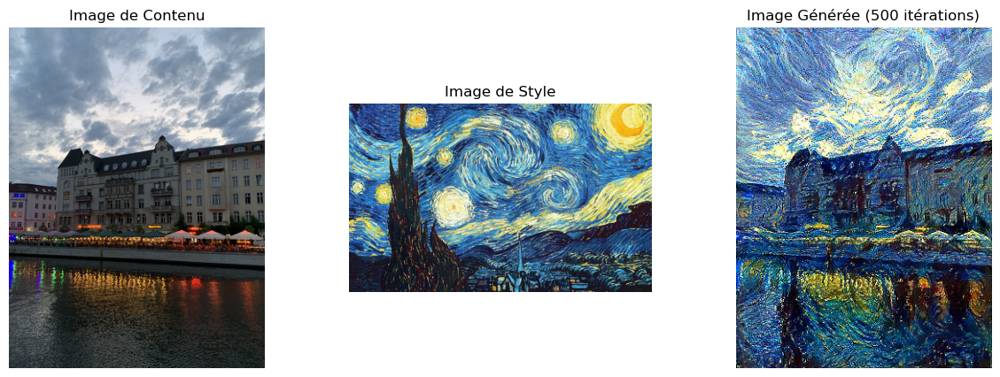

In [17]:
display_generated_image(CONTENT_IMAGE, STYLE_IMAGE, NUM_ITERATIONS)

Le détail des images générées se trouvent dans le fichier *output_images* !

<div class="alert alert-warning">

**Bonus : construisez votre gif comme celui que vous avez vu au départ !**

En réalité, nous avons fait le choix de ne pas uniquement enregistrer l'image finale visible ci-dessus, mais également des images intermédiaires lors de la construction de votre image ! Ainsi, en reprenant l'ensemble de ces images, il est possible de construire un gif comme celui en début de notebook.  
Pour cela, lancez le code ci-dessous !

</div>

In [18]:
content_name = os.path.splitext(CONTENT_IMAGE)[0]
style_name = os.path.splitext(STYLE_IMAGE)[0]
output_folder = f"combined_{content_name}_{style_name}"
generated_images_path = os.path.join("./data/output-images", output_folder)
generated_gif_path = os.path.join("./data/gifs_generated", f"{output_folder}.gif")

In [19]:
create_gif_from_images(generated_images_path, generated_gif_path)

GIF créé avec succès : ./data/gifs_generated/combined_berlin_van_gogh.gif


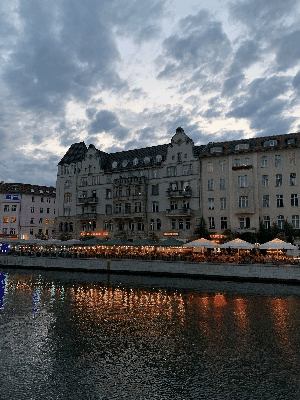

In [20]:
display_gif(generated_gif_path)

Sympa n'est-ce pas ? Au point d'avoir sa place au Louvre ?  
Vous devez brûler d'impatience de relancer la génération d'une nouvelle image avec des paramètres différents et / ou des images de contenu et de style différentes. N'hésitez-pas ! Mais pour ce qui est des paramètres, une partie du travail est réalisée ci-dessous. Nous allons ainsi, à travers des exemples, discuter de l'importance de certains paramètres. 

# 6. Discussion et Comparaisons

## 6.1 Le nombre d'itérations

Illustrons l'influence du nombre d'itérations sur l'image finale.
Commençons par prendre l'exemple de votre image générée :

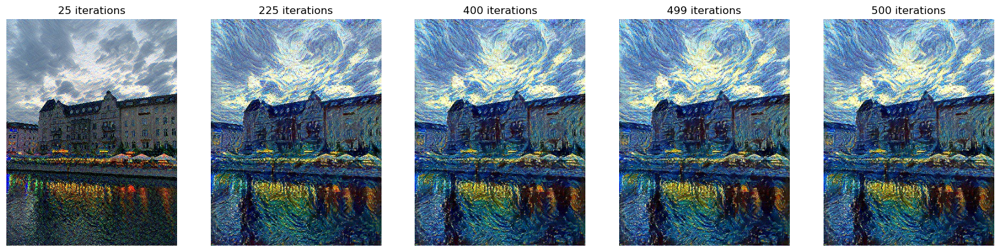

In [21]:
images, iterations = select_files(generated_images_path)
display_five_images(images, iterations)

Regardons un autre exemple : 

![alt text](illustrations/comparaison_iterations.png)

Nous observons que le contenu s'efface peu à peu (au profit du style ?) au fur et à mesure des itérations. Même si la perte totale est optimisée et, qu'au bout d'un certain nombre d'itérations, l'équilibre entre perte de contenu et de style se fait, chaque itération modifie l'image précédente et l'éloigne un peu plus de l'image de contenu originale. Les différences se remarquent surtout à faibles nombres d'itérations, et s'atténuent à nombre d'itérations important. C'est ce que nous observons ici. 

## 6.2 Average Pooling vs Max Pooling

<center>
        <img src="illustrations/poolings.png" alt="Poolings" width="500">
        <figcaption>Comparaison Max Pooling vs Average Pooling </figcaption>
</center>

<div class="alert alert-info">

**Rappel - couches de pooling**

Les couches de pooling sont utilisées dans les réseaux de neurones convolutionnels (CNN) pour **réduire la taille des cartes de caractéristiques tout en conservant les informations essentielles**. Elles permettent notamment de réduire la complexité computationnelle et de diminuer le risque de sur-apprentissage.  
Il existe 2 grands type de pooling : 
- le **'*max pooling*'**, utilisé dans le modèle VGG19, qui prend la valeur maximale dans la région et permet ainsi de capturer les caractéristiques les plus importantes de l'image 
- le **'*average pooling*'**; qui prend la moyenne des valeurs dans le région, et ainsi lisse les informations et réduit les variations. 

</div>

La lecture des papiers, et notamment celui de Gatys et al., indique que l'utilisation d'un '*average pooling*' en lieu et place des '*max pooling*' dans le modèle VGG19 donne des meilleurs résultats. Comparons cela !  
Voici le modèle utilisé avec les average pooling :

In [22]:
model_avg_pool = VGG_avg_pool(requires_grad=False, show_progress=True)   
print(model_avg_pool)

VGG_avg_pool(
  (slice1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (slice2): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
  )
  (slice3): Sequential(
    (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
  )
  (slice4): Sequential(
    (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(256, 256, kernel_size=(

On remarque que ce modèle est bien identique au précédent, à l'exception des max-pooling remplacés par des average pooling.  
Comparons leur sortie respective :

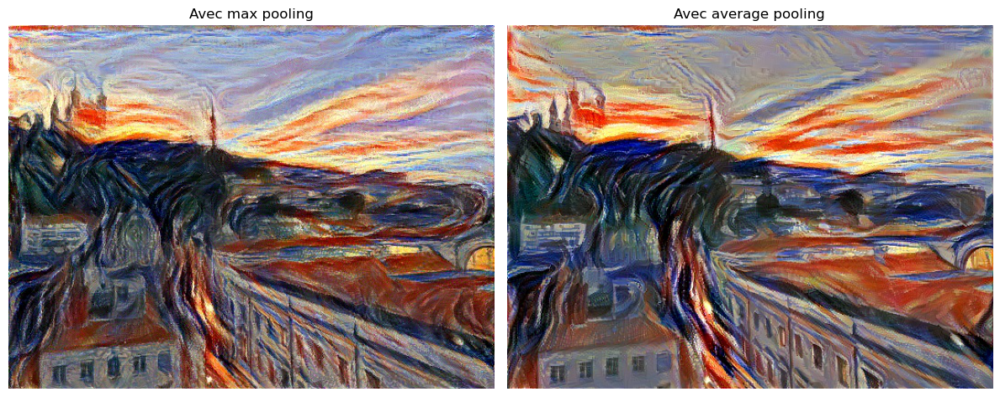

In [23]:
display_images_side_by_side('./illustrations/lyon_munch_300.jpg', './illustrations/lyon_munch_300_avg_pool.jpg', 
                            titles=['Avec max pooling', 'Avec average pooling'])

Des différences assez flagrantes existent entre les résultats issus de ces 2 modèles, au moins sur cet exemple. La conclusion selon laquelle *average pooling* donne de meilleurs résultats que *max pooling* est laissée à l'appréciation du lecteur, en raison de la subjectivité d'une telle affirmation. 

## 6.3 Le choix de la couche pour représenter le *content*

<div class='alert alert-info'>

Les articles au sujet du NST décrivent ce que capturent en théorie les différentes couches de convolution du modèle VGG :  

🔹Les **couches plus profondes (comme conv5)** : capturent des informations très abstraites et globales. Le choix de ce genre de couche causerait la perte de beaucoup de détails spatiaux et de structures locales, ce qui pourrait entraîner une perte des formes précises et des détails visuels du contenu.   

🔹Les **couches intermédiaires (comme conv4_2)** capturent un équilibre entre les détails de bas niveau (comme les contours et les structures) et les concepts abstraits (comme les formes et les relations entre les objets). Un tel choix permet alors de maintenir les détails essentiels de l'image source tout en permettant une stylisation plus flexible.  

🔹Les **couches peu profondes (comme conv1)** capturent uniquement des caractéristiques de très bas niveau, comme les bords ou les motifs locaux. Ces couches ne seraient alors pas adaptées pour le contenu global, car elles ne comprennent pas la structure plus large ou les relations des objets dans l’image.   

</div>

Nous cherchons alors à illustrer cette théorie. Pour cela, nous réalisons 2 générations d'image avec les mêmes paramètres, à partir du modèle de VGG19 contenant des *max pooling*, mais l'une ayant comme couche de contenu *conv4_2*, l'autre *conv1_2*.  
Voici le résultat : 

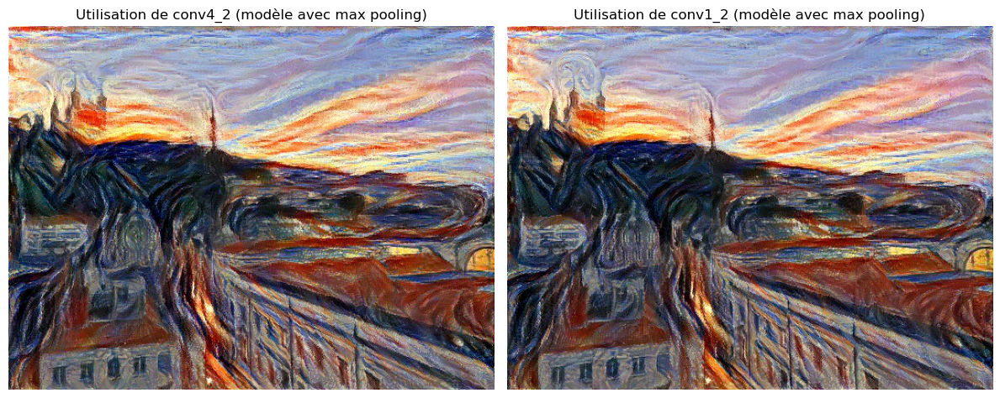

In [24]:
display_images_side_by_side('./illustrations/lyon_munch_300.jpg', 
                            './illustrations/lyon_munch_300_conv1.jpg', 
                            titles=['Utilisation de conv4_2 (modèle avec max pooling)', 'Utilisation de conv1_2 (modèle avec max pooling)'])

Les différences sont légères. Admettons-le, il est peu évident de constater les éléments théoriques énoncés ci-dessus. On constate certaines différences dans les couleurs et les formes (au dessus de la cathédrale, l'allée entre les immeubles, etc.).  

Pour vous en convaincre, vérifions avec une heatmap comparant la couleur des pixels un par un ci-dessous. 
 
*Remarque : on distingue un léger 'overfitting' de style au centre - gauche de l'image : on remarque la forme de l'entité qui crie dans le tableau de Munch !*

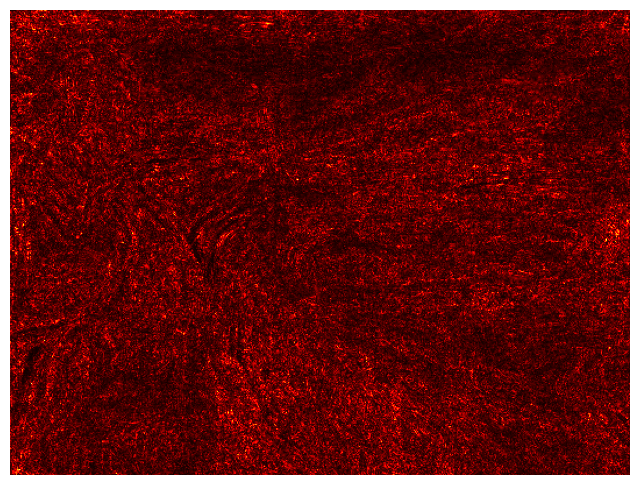

In [25]:
hm2 = generate_difference_heatmap('./illustrations/lyon_munch_300.jpg', './illustrations/lyon_munch_300_conv1.jpg')
show_heatmap(hm2)

Les résultats ci-dessus ne parviennent pas à complètement illustrer la théorie issue des papiers. Animés par la volonté d'observer cette théorie en pratique, nous décisons de tenter une nouvelle fois, en utilisant cette fois-ci le second modèle, celui avec des *average pooling*.  

Examinons les résultats : 

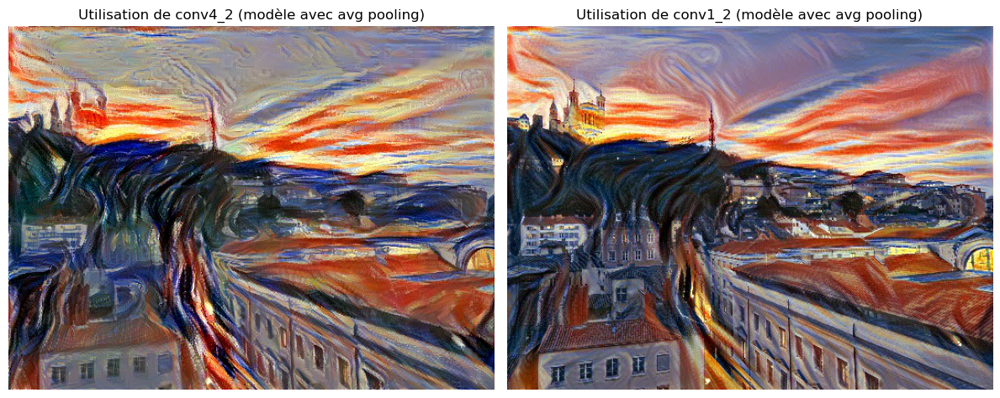

In [26]:
display_images_side_by_side('./illustrations/lyon_munch_300_avg_pool.jpg', 
                            './illustrations/lyon_munch_300_avg_pool_conv_1.jpg', 
                            titles=['Utilisation de conv4_2 (modèle avec avg pooling)', 'Utilisation de conv1_2 (modèle avec avg pooling)'])

Cette fois-ci les éléments théorique énoncés en début de rubrique se vérifient ! L'utilisation d'une couche peu profonde (conv1_2 ici) donne un résultat moins naturel ; l'impression résultante est celle d'un filtre sur une photographie.  

Ainsi, nous avons illustré un élément qui n'apparraissait pas dans les papiers : l'**influence** du choix de la couche de content dépend fortement en amont du choix entre average pooling et max pooling !

## 6.4 Variation dans la répartition des poids sur la perte

Examinons les conséquences lorsque nous changeons les poids attribués aux différents termes de l'expression de la perte totale.  

Dans un premier temps, nous allons jouer sur les poids des pertes de style et de contenu. A partir des poids par défaut, on fait varier le rapport $λ_C / λ_S$ de 0.01 à 100, afin d'étudier l'influence de ces poids. 
 
*NB : le poids de la variation totale n'est pas modifié pour l'instant.* 

<center>
        <img src="illustrations/comparaison poids.png" alt="poids" width="1200">
        <figcaption>Illustration de l'influence des poids </figcaption>
</center>


On observe des résultats attendus, le style est privilégié lorsqu'on augmente son poids relativement au contenu. 

Examinons désormais l'influence de la variation totale. Comparons l'image issue de la génération avec les poids par défaut, avec une image générée à partir d'un poids de variation totale $λ_{TV}$ nul. 

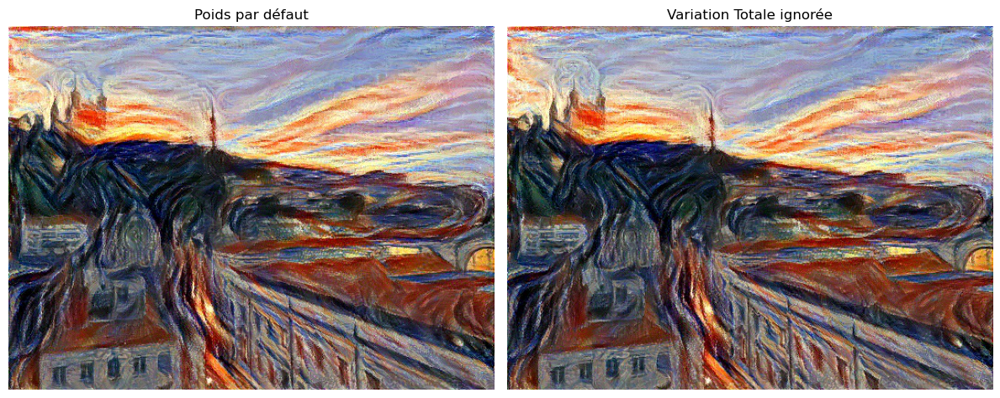

In [27]:
display_images_side_by_side('./illustrations/lyon_munch_300.jpg', 
                            './illustrations/sans_tv.jpg', 
                            titles=['Poids par défaut', 'Variation Totale ignorée'])

On ne distingue pas réellement de différence, ceci s'explique par le faible poids initial de la variation totale.  

Que se passe-t-il en revanche si on multiplie le poids de la variation totale $λ_{TV}$ par 1000 par rapport au poids par défaut ?

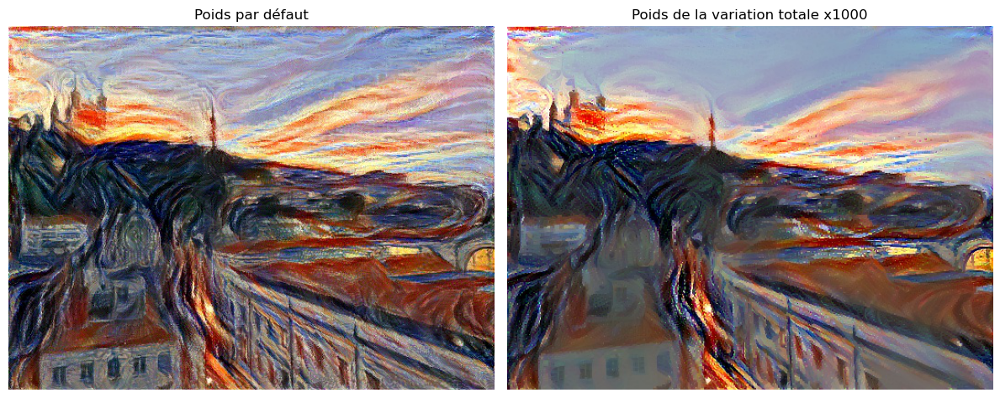

In [28]:
display_images_side_by_side('./illustrations/lyon_munch_300.jpg', 
                            './illustrations/tv1000.jpg', 
                            titles=['Poids par défaut', 'Poids de la variation totale x1000'])

Cette comparaison illustre le rôle théorique de la variation totale. En accordant de l'importance à cette perte, l'image générée présente alors des variations moins importantes entre pixels adjacents, rendant les régions davantage monochromes. 

Afin d'illustrer davantage les propos des 2 sections ci-dessus, voici une image extraite du papier de Gatys et al.  
De haut en bas, la couche utilisée pour représenter le contenu est de plus en plus profonde.  
De gauche à droite, le poids donné à la loss de style par rapport à la loss de content diminue.


<center>
        <img src="illustrations/gatys.png" alt="gatys" width="700">
        <figcaption>Illustration de l'influence des poids et du choix de la couche de contenu </figcaption>
</center>


<div class='alert alert-warning'>

**A vous de jouer !**

Nous avons globalement balayé les paramètres principaux influençant le résultat de l'image générée. S'il vous reste du temps, n'hésitez pas à réaliser vos propres générations en reprenant la section 5 et en jouant avec tous les paramètres évoqués ci-dessus. Pour information :  
🔹Les noms d'image de contenu et de style sont contenus dans les variables globales **STYLE_IMAGE** et **CONTENT_IMAGE** en introduction de notebook  
🔹Le nombre d'itération se trouve dans la variable globale **NUM_ITERATIONS**.  
🔹Le modèle utilisant des *average pooling* est disponible dans le fichier *models/definitions*. Afin de l'utiliser, changez le nom du modèle dans la variable **MODEL** en début de notebook !  
🔹Les poids des pertes sont définis dans le paramètre *config* en section 5.  

Changer la couche représentant le *content* requiert une modification du model, mais n'hésitez-pas à essayer si vous le souhaiter !

</div>

<div class='alert alert-warning'>

**Pour aller plus loin** : 

Nous avons fait le choix dans ce notebook d'illustrer la théorie et la pratique du NST en se basant sur le fonctionnement décrit notamment dans le papier de Gatys et al. Il existe d'autres fonctionnemements, dont nous donnons quelques notions ci-dessous :  
🔹**Modélisation de texture avec les Markov Random Fields** (MRFs) : contrairement à la matrice de Gram, qui ignore la disposition spatiale des textures, les MRFs modélisent chaque pixel en fonction de son voisinage, ce qui permet une meilleure cohérence locale. Cela conserve mieux les structures fines et les motifs répétitifs.  
🔹**Réseaux feed-forward pour un transfert de style rapide** : plutôt que d'optimiser chaque image individuellement (comme dans la méthode de Gatys), un réseau de neurones est pré-entraîné pour appliquer un style instantanément à n'importe quelle image. cela présente l'avantage d'être beaucoup plus rapide qu'une optimisation itérative (exécution en un forward pass).  
🔹**Transfert de style basé sur les GANs (Generative Adversarial Networks)** : un réseau générateur apprend à produire une image stylisée, tandis qu'un discriminateur évalue si l'image est réaliste, forçant ainsi le générateur à produire un résultat plus convaincant. Une telle méthode pourrait permettre de générer des images de meilleure qualité et plus naturelles.  
Si vous souhaitez approfondir ces sujets, ainsi que l'historique liée au NST, nous vous invitons à consulter le lien suivant : https://ieeexplore.ieee.org/abstract/document/8732370/

</div>

# Références



Gatys et al., *A Neural Algorithm of Artistic Style*, 2015 : https://arxiv.org/pdf/1508.06576  

Y. Jing et al., *Neural Style Transfer: A Review* : https://ar5iv.labs.arxiv.org/html/1705.04058#:~:text=The%20seminal%20work%20of%20Gatys%20et%20al.%20demonstrated,is%20referred%20to%20as%20Neural%20Style%20Transfer%20%28NST%29.  

N.Nafis, *A Lightweight PyTorch Implementation of Neural Style Transfer*, 2021 : https://medium.com/geekculture/a-lightweight-pytorch-implementation-of-neural-style-transfer-86603e5eb551  

A.Andrew et al., *Compare VGG19, ResNet50, Inception-V3 for Review Food Rating*, 2022 : https://www.researchgate.net/publication/360020540_Compare_VGG19_ResNet50_Inception-V3_for_Review_Food_Rating  

R.Kassel, *VGG : en quoi consiste ce modèle ? Daniel vous dit tout !*, 2021 : https://datascientest.com/quest-ce-que-le-modele-vgg  

Le code de ce notebook est un code adapté largement inspiré du github suivant https://github.com/nazianafis/Neural-Style-Transfer
